In [237]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, losses
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import cv2

from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

import os

## Pre-processing

In [29]:
files_dir = "assignment_dataset/train/image"
labels_dir = "assignment_dataset/train/label"

processed_image_dir = "preprocessed/image"
processed_label_dir = "preprocessed/label"

files = os.listdir(files_dir)
labels = os.listdir(labels_dir)

In [172]:
def get_img_n_label_old(cvt_grayscale = True):

    X = []
    y = []

    processed_image_dir = "preprocessed/image"
    for file in files:
        img = cv2.imread(os.path.join(files_dir,file))
        img = cv2.resize(img, (128,128))
        if cvt_grayscale == True:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        cv2.imwrite(os.path.join(processed_image_dir, file), img)

        X.append(img)

    processed_label_dir = "preprocessed/label"
    for label in labels:
        label_img = cv2.imread(os.path.join(labels_dir,label))
        label_img = cv2.resize(label_img, (128,128))
        if cvt_grayscale == True:
            label_img = cv2.cvtColor(label_img, cv2.COLOR_BGR2GRAY)
        cv2.imwrite(os.path.join(processed_label_dir, label), label_img)

        y.append(label_img)

    X = np.array(X)
    y = np.array(y)

    #Normalize
    X = X/255.0
    y = y/255.0

    return X,y

In [195]:
def get_img_n_label(cvt_grayscale = True):

    X = []
    y = []

    img_files = []
    label_files = []
    
    processed_image_dir = "preprocessed/image"
    processed_label_dir = "preprocessed/label"

    for file in files:
        img = cv2.imread(os.path.join(files_dir,file))
        img = cv2.resize(img, (128,128))
        if cvt_grayscale == True:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        cv2.imwrite(os.path.join(processed_image_dir, file), img)

        X.append(img)

        label = file.split(".")[0]+".png"
        label_img = cv2.imread(os.path.join(labels_dir, label))
        label_img = cv2.resize(label_img, (128,128))
        if cvt_grayscale == True:
            label_img = cv2.cvtColor(label_img, cv2.COLOR_BGR2GRAY)
        cv2.imwrite(os.path.join(processed_label_dir, label), label_img)

        y.append(label_img)

        img_files.append(file)
        label_files.append(label)

    X = np.array(X)
    y = np.array(y)

    #Normalize
    X = X/255.0
    y = y/255.0

    print(img_files)
    print(label_files)

    return X,y

In [196]:
X_3d,y_3d = get_img_n_label(cvt_grayscale=False)
print(X_3d.shape, y_3d.shape)

['8.jpg', '28.jpg', '29.jpg', '15.jpg', '17.jpg', '16.jpg', '13.jpg', '39.jpg', '11.jpg', '38.jpg', '21.jpg', '35.jpg', '20.jpg', '22.jpg', '23.jpg', '27.jpg', '26.jpg', '32.jpg', '24.jpg', '30.jpg', '31.jpg', '19.jpg', '5.jpg', '43.jpg', '7.jpg', '41.jpg', '44.jpg', '45.jpg', '47.jpg', '46.jpg']
['8.png', '28.png', '29.png', '15.png', '17.png', '16.png', '13.png', '39.png', '11.png', '38.png', '21.png', '35.png', '20.png', '22.png', '23.png', '27.png', '26.png', '32.png', '24.png', '30.png', '31.png', '19.png', '5.png', '43.png', '7.png', '41.png', '44.png', '45.png', '47.png', '46.png']
(30, 128, 128, 3) (30, 128, 128, 3)


In [197]:
X_gray, y_gray = get_img_n_label()
print(X_gray.shape, y_gray.shape)

['8.jpg', '28.jpg', '29.jpg', '15.jpg', '17.jpg', '16.jpg', '13.jpg', '39.jpg', '11.jpg', '38.jpg', '21.jpg', '35.jpg', '20.jpg', '22.jpg', '23.jpg', '27.jpg', '26.jpg', '32.jpg', '24.jpg', '30.jpg', '31.jpg', '19.jpg', '5.jpg', '43.jpg', '7.jpg', '41.jpg', '44.jpg', '45.jpg', '47.jpg', '46.jpg']
['8.png', '28.png', '29.png', '15.png', '17.png', '16.png', '13.png', '39.png', '11.png', '38.png', '21.png', '35.png', '20.png', '22.png', '23.png', '27.png', '26.png', '32.png', '24.png', '30.png', '31.png', '19.png', '5.png', '43.png', '7.png', '41.png', '44.png', '45.png', '47.png', '46.png']
(30, 128, 128) (30, 128, 128)


In [198]:
def display_processed_images_labels(X,Y):
    for x,y in zip(X,Y):
        fig, (ax1, ax2, ax3) = plt.subplots(1,3)

        overlay_image = cv2.addWeighted(x,1,y,.1,0)
        ax1.set_title("Image")
        ax1.imshow(x)
        ax2.set_title("Label")
        ax2.imshow(y)
        ax3.set_title("Superimposed")
        ax3.imshow(overlay_image)

        plt.show()

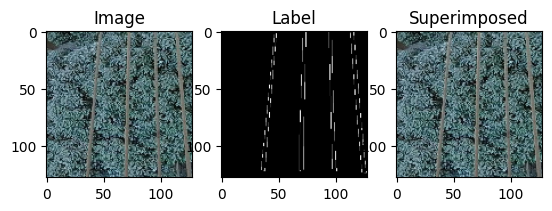

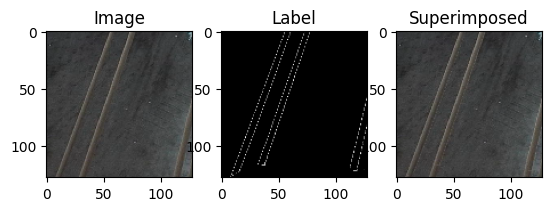

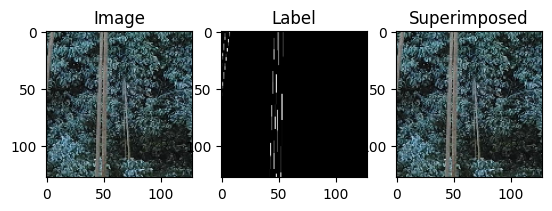

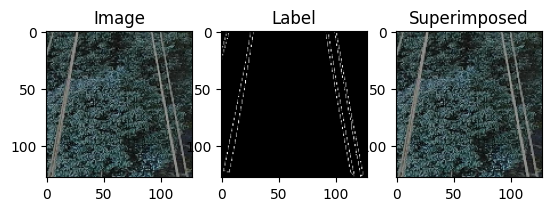

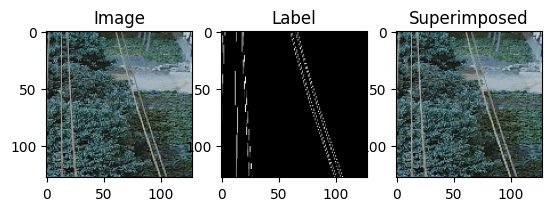

...

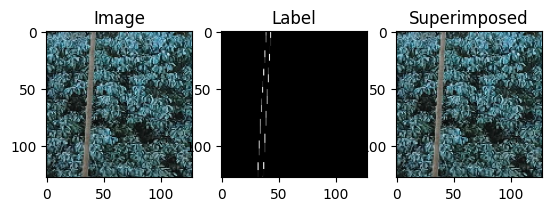

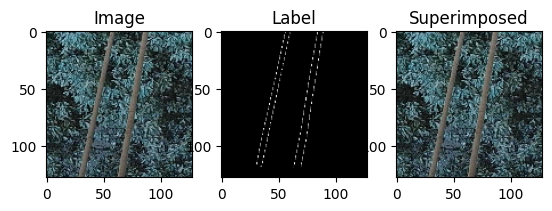

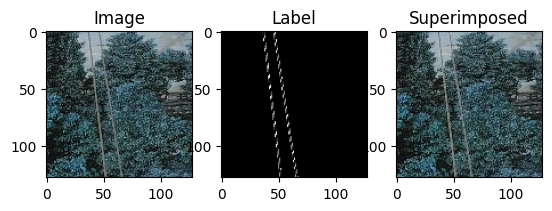

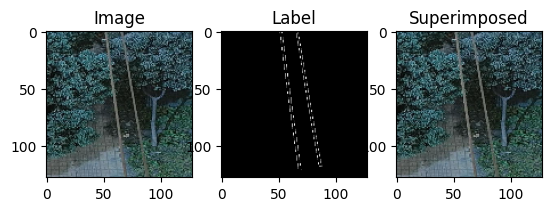

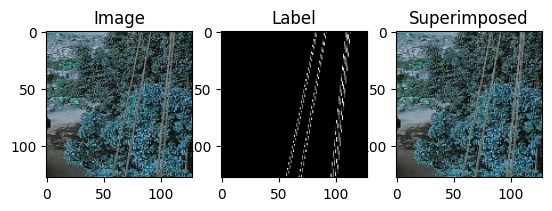

In [199]:
display_processed_images_labels(X_3d, y_3d)

#### Display preocessed images

In [166]:
def display_processed_images(is_grayscale=True):
    for file,label in zip(files,labels):
        print(file, label)
        
        if is_grayscale == True:
            img = cv2.imread(os.path.join(processed_image_dir,file), cv2.IMREAD_GRAYSCALE )
            label = cv2.imread(os.path.join(processed_label_dir,label), cv2.IMREAD_GRAYSCALE)
        else:
            img = cv2.imread(os.path.join(processed_image_dir,file) )
            label = cv2.imread(os.path.join(processed_label_dir,label))
        
        fig, (ax1, ax2, ax3) = plt.subplots(1,3)

        overlay_image = cv2.addWeighted(img,1,label,.1,0)
        ax1.set_title("Image")
        ax1.imshow(img)
        ax2.set_title("Label")
        ax2.imshow(label)
        ax3.set_title("Superimposed")
        ax3.imshow(overlay_image)

        plt.show()

8.jpg 8.png


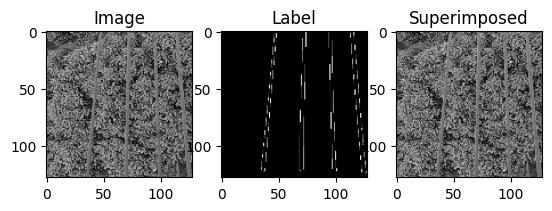

28.jpg 28.png


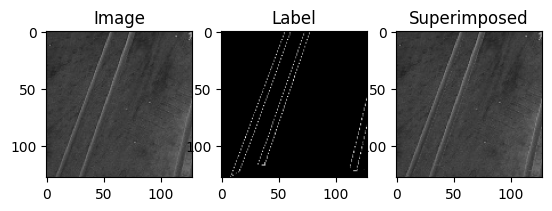

29.jpg 29.png


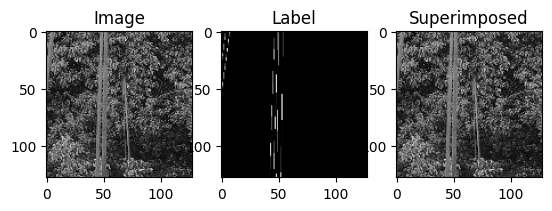

15.jpg 15.png


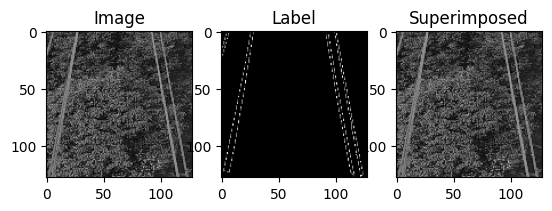

17.jpg 17.png


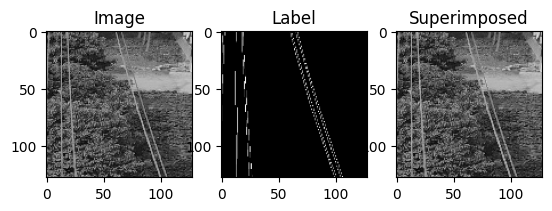

16.jpg 16.png


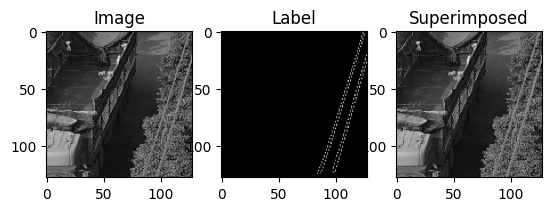

13.jpg 13.png


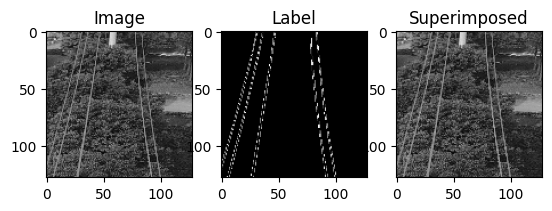

39.jpg 39.png


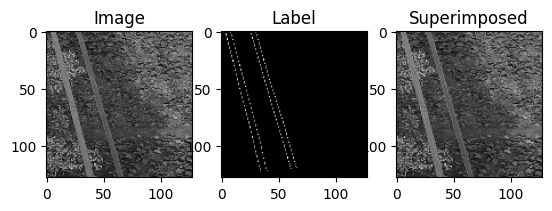

11.jpg 11.png


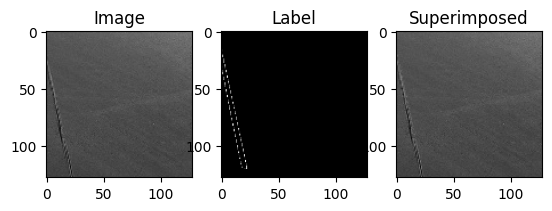

38.jpg 38.png


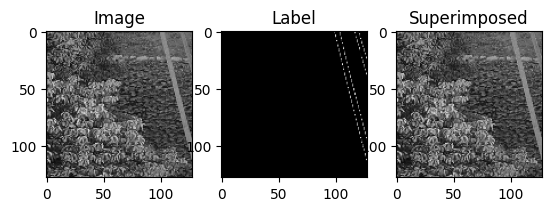

21.jpg 35.png


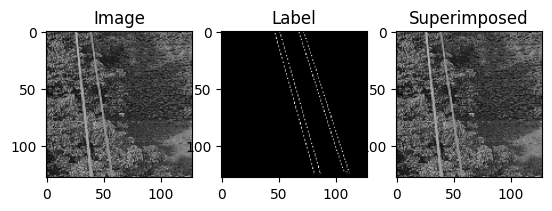

35.jpg 21.png


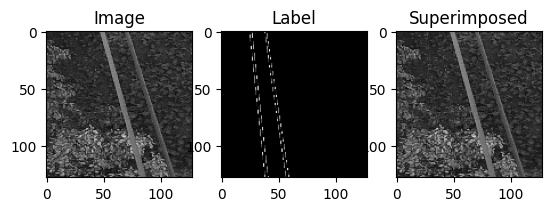

20.jpg 20.png


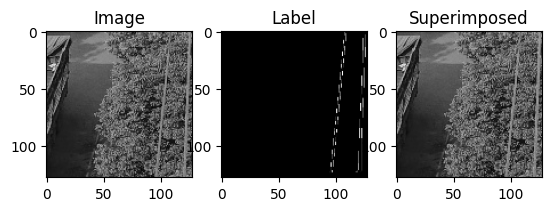

22.jpg 22.png


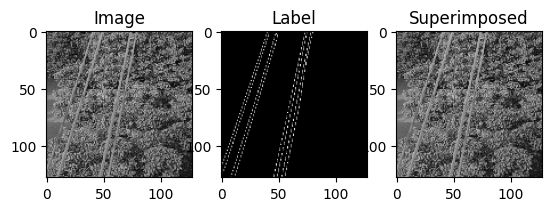

23.jpg 23.png


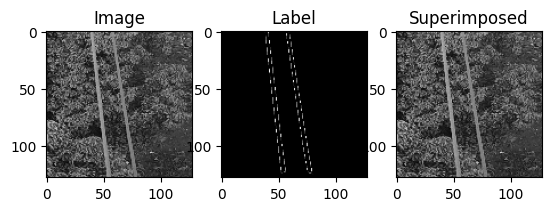

27.jpg 27.png


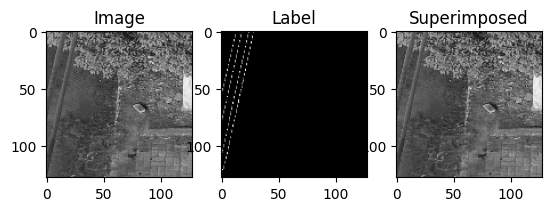

26.jpg 32.png


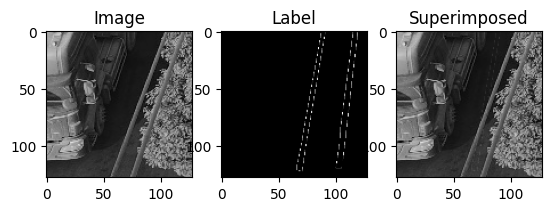

32.jpg 26.png


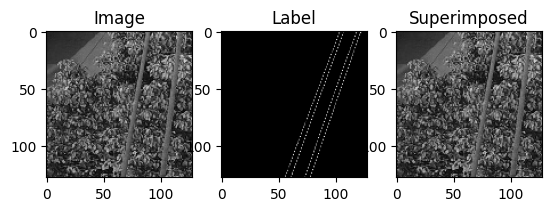

24.jpg 30.png


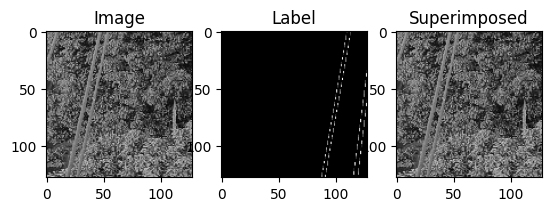

30.jpg 24.png


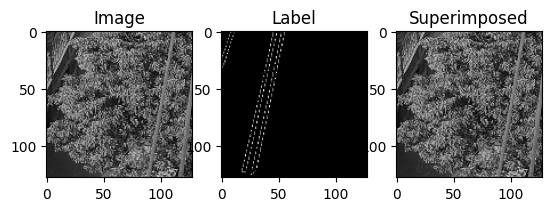

31.jpg 31.png


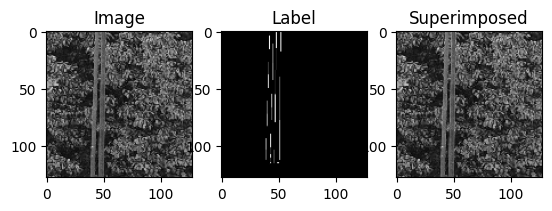

19.jpg 19.png


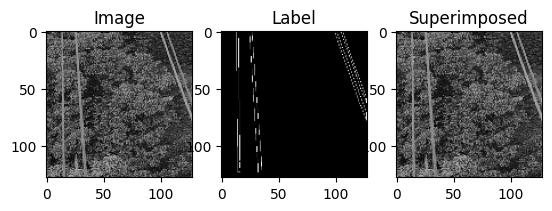

5.jpg 43.png


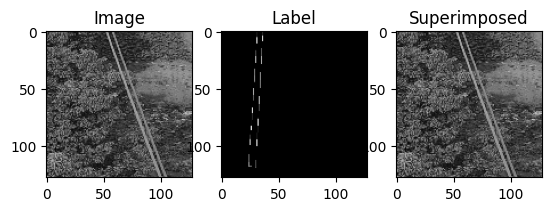

43.jpg 5.png


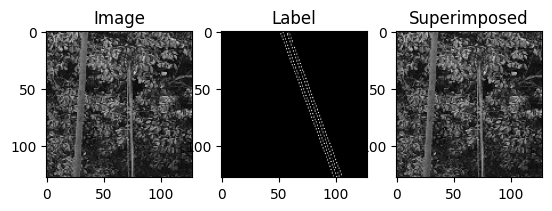

7.jpg 41.png


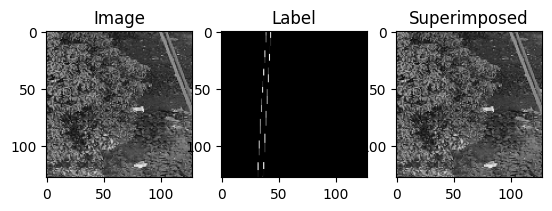

41.jpg 7.png


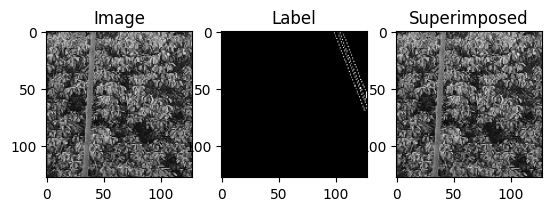

44.jpg 44.png


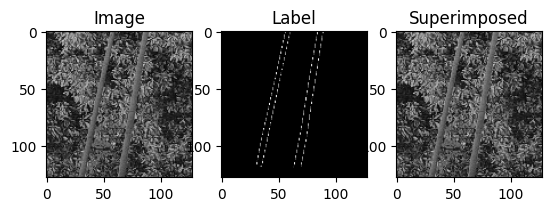

45.jpg 45.png


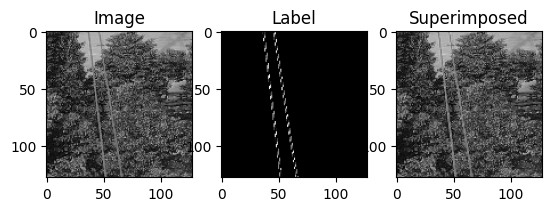

47.jpg 47.png


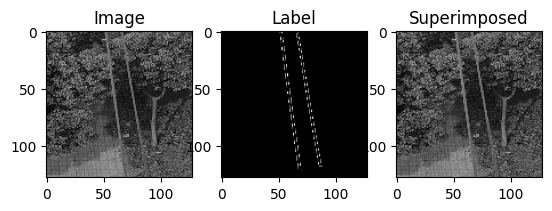

46.jpg 46.png


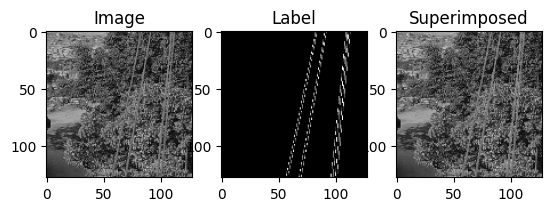

In [167]:
display_processed_images(is_grayscale=False)

## Modeling

#### Data split

In [139]:
X_train, X_test, y_train, y_test = train_test_split(X_3d,y_3d, test_size=0.1, random_state=42)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(27, 128, 128, 3) (27, 128, 128, 3)
(3, 128, 128, 3) (3, 128, 128, 3)


#### Functions

In [39]:
def dice_coeff(y_true, y_pred):
    smooth = 1.
    # Flatten
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

def bce_dice_loss(y_true, y_pred):
    loss = losses.binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss

In [288]:
def double_conv_block(x, n_filters):

   # Conv2D then ReLU activation
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
   # Conv2D then ReLU activation
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)

   return x

def downsample_block(x, n_filters):
   f = double_conv_block(x, n_filters)
   p = layers.MaxPool2D(2)(f)
   p = layers.Dropout(0.05)(p)

   return f, p

def upsample_block(x, conv_features, n_filters):
   # upsample
   x = layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
   # concatenate
   x = layers.concatenate([x, conv_features])
   # dropout
   x = layers.Dropout(0.05)(x)
   # Conv2D twice with ReLU activation
   x = double_conv_block(x, n_filters)

   return x

def double_conv_block_gray(x, n_filters):
   # Conv2D then ReLU activation
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal", data_format="channels_last")(x)
   # Conv2D then ReLU activation
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal", data_format="channels_last")(x)

   return x

def build_unet_model(is_out_gray=True, optimizer=tf.keras.optimizers.legacy.Adam(), loss="binary_crossentropy", metrics=['accuracy']):
    # inputs
   if is_out_gray == True:
      inputs = layers.Input(shape=(128,128,1))
   else:
      inputs = layers.Input(shape=(128,128,3))

   # encoder: contracting path - downsample
   # 1 - downsample
   if is_out_gray == True:
      f1 = double_conv_block_gray(inputs, 64)
      p1 = layers.MaxPool2D(2)(f1)
      p1 = layers.Dropout(0.3)(p1)
      
   else:
      f1, p1 = downsample_block(inputs, 64)

   # 2 - downsample
   f2, p2 = downsample_block(p1, 128)
   # 3 - downsample
   f3, p3 = downsample_block(p2, 256)
   # 4 - downsample
   f4, p4 = downsample_block(p3, 512)

   # 5 - bottleneck
   bottleneck = double_conv_block(p4, 1024)

   # decoder: expanding path - upsample
   # 6 - upsample
   u6 = upsample_block(bottleneck, f4, 512)
   # 7 - upsample
   u7 = upsample_block(u6, f3, 256)
   # 8 - upsample
   u8 = upsample_block(u7, f2, 128)
   # 9 - upsample
   u9 = upsample_block(u8, f1, 64)

   # outputs
   if is_out_gray == True:
      outputs = layers.Conv2D(1, 1, padding="same", activation = "sigmoid")(u9)
   else :
      outputs = layers.Conv2D(3, 1, padding="same", activation = "softmax")(u9)

   # unet model with Keras Functional API
   unet_model = tf.keras.Model(inputs, outputs, name="U-Net")

   unet_model.compile(optimizer=optimizer,
                    loss=loss,
                    metrics=metrics)

   return unet_model

In [289]:
def train_unet_model(X, y, validation_data, is_out_gray=True, optimizer=tf.keras.optimizers.legacy.Adam(), loss="binary_crossentropy", metrics=['accuracy'],
                            epochs=10, batch_size=10, callbacks=[]):
    
    model = build_unet_model(is_out_gray=is_out_gray)

    model_history = model.fit(X, y, epochs=epochs, batch_size=batch_size, validation_data=validation_data,
                                                    callbacks=callbacks
    )

    #Plot the first of the metrics
    met1 = str(metrics[0]).lower()
    val_met1 = "val_" + met1
    
    plt.figure(figsize=(10,3))

    plt.subplot(1,3,1)
    sns.lineplot(x=range(0,epochs), y=model_history.history[met1]).set(title= met1 + " Vs Epochs")

    plt.subplot(1,3,2)
    sns.lineplot(x=range(0,epochs), y=model_history.history[val_met1]).set(title= val_met1 + " Vs Epochs")

    plt.subplot(1,3,3)
    sns.lineplot(x=range(0,epochs), y=model_history.history['loss']).set(title="loss Vs Epochs")

    plt.show()

    print(model.evaluate(X_test, y_test))
    y_pred = model.predict(X_test)

    y_pred_t_4 = (y_pred > .4).astype(np.uint8)
    y_pred_t_5 = (y_pred > .5).astype(np.uint8)
    y_pred_t_7 = (y_pred > .7).astype(np.uint8)

    for x , y , pred , pred_t_4 , pred_t_5, pred_t_7 in zip(X_test, y_test, y_pred, y_pred_t_4, y_pred_t_5, y_pred_t_7):

        plt.figure(figsize=(30,7))

        _ , (ax1,ax2,ax3,ax4,ax5,ax6) = plt.subplots(1,6, figsize=(10,5))
        ax1.set_title("Image")
        ax1.imshow(x, cmap="gray")
        
        ax2.set_title("True")
        ax2.imshow(y, cmap="gray")
        
        ax3.set_title("Predict")
        ax3.imshow(pred, cmap="gray")
        
        ax4.set_title("Pred Binary 0.4")
        ax4.imshow(pred_t_4, cmap="gray")

        ax5.set_title("Pred Binary 0.5")
        ax5.imshow(pred_t_5, cmap="gray")

        ax6.set_title("Pred Binary 0.7")
        ax6.imshow(pred_t_7, cmap="gray")


#### Train - 3d model

##### 1000 epochs

In [81]:
unet_model = build_unet_model(is_out_gray=False)

unet_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(),
                  loss="binary_crossentropy",
                  metrics=['accuracy'])

NUM_EPOCHS = 1000

model_history = unet_model.fit(X_train, y_train, epochs=NUM_EPOCHS, batch_size=10, validation_split=0.1 )

Epoch 1/1000
3/3 [==============================] - 7s 2s/step - loss: 1.1854 - accuracy: 0.5458 - val_loss: 0.3604 - val_accuracy: 0.1497
Epoch 2/1000
3/3 [==============================] - 5s 2s/step - loss: 0.3211 - accuracy: 0.1892 - val_loss: 0.2068 - val_accuracy: 0.0127
Epoch 3/1000
3/3 [==============================] - 5s 2s/step - loss: 0.1598 - accuracy: 0.0483 - val_loss: 0.1117 - val_accuracy: 0.0063
Epoch 4/1000
3/3 [==============================] - 6s 2s/step - loss: 0.0985 - accuracy: 0.0376 - val_loss: 0.1485 - val_accuracy: 0.0026
Epoch 5/1000
3/3 [==============================] - 6s 2s/step - loss: 0.1127 - accuracy: 0.0231 - val_loss: 0.1504 - val_accuracy: 0.0057
Epoch 6/1000
3/3 [==============================] - 7s 2s/step - loss: 0.1105 - accuracy: 0.0752 - val_loss: 0.1373 - val_accuracy: 0.3022
Epoch 7/1000
3/3 [==============================] - 5s 2s/step - loss: 0.1003 - accuracy: 0.3566 - val_loss: 0.1205 - val_accuracy: 0.4808
Epoch 8/1000
3/3 [=========

##### y_pred

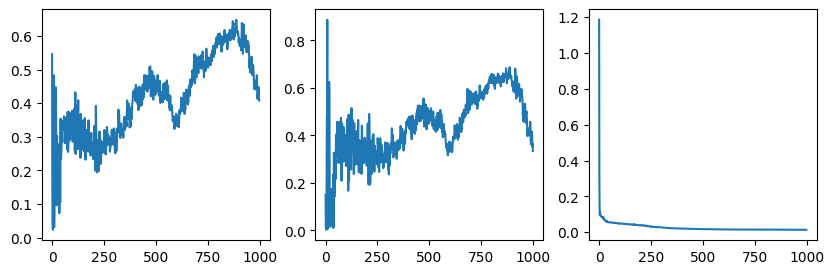

In [83]:
plt.figure(figsize=(10,3))

plt.subplot(1,3,1)
sns.lineplot(x=range(0,NUM_EPOCHS), y=model_history.history['accuracy'])

plt.subplot(1,3,2)
sns.lineplot(x=range(0,NUM_EPOCHS), y=model_history.history['val_accuracy'])

plt.subplot(1,3,3)
sns.lineplot(x=range(0,NUM_EPOCHS), y=model_history.history['loss'])

plt.show()

In [207]:
unet_model.save("model/unet_3d_model")

INFO:tensorflow:Assets written to: model/unet_3d_model/assets


INFO:tensorflow:Assets written to: model/unet_3d_model/assets


In [151]:
y_pred = unet_model.predict(X_test)
y_pred_t = (y_pred > 0.1).astype(np.uint8)

1/1 [==============================] - 0s 200ms/step


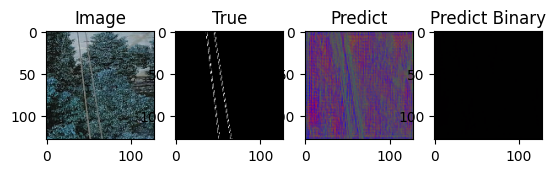

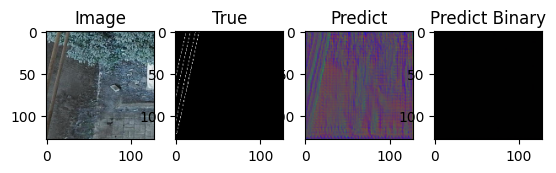

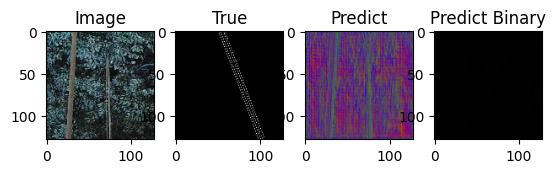

In [152]:
for x,y,pred,pred_t in zip(X_test, y_test, y_pred, y_pred_t):

    fig, (ax1,ax2,ax3,ax4) = plt.subplots(1,4)
    ax1.set_title("Image")
    ax1.imshow(x)
    ax2.set_title("True")
    ax2.imshow(y)
    ax3.set_title("Predict")
    ax3.imshow(pred)
    ax4.set_title("Predict Binary")
    ax4.imshow(pred_t)

##### show train pred

In [86]:
y_train_pred = unet_model.predict(X_train)

1/1 [==============================] - 2s 2s/step


/var/folders/hm/r5pwp4rs5zd7v5745srhxk7w0000gn/T/ipykernel_4779/2825489878.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1,ax2,ax3) = plt.subplots(1,3)


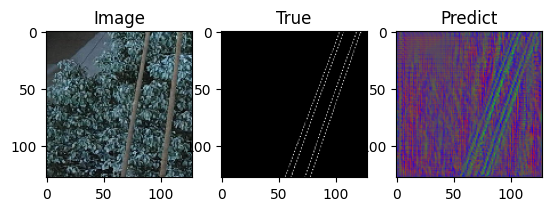

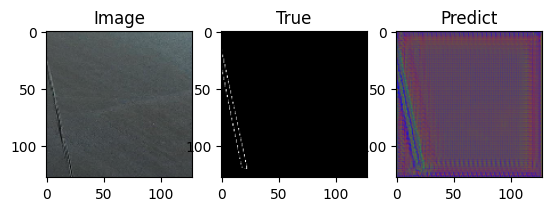

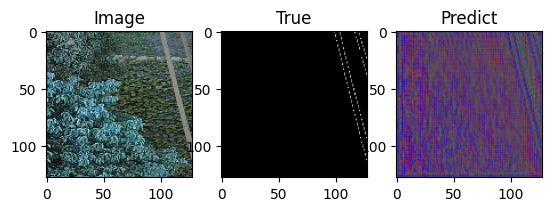

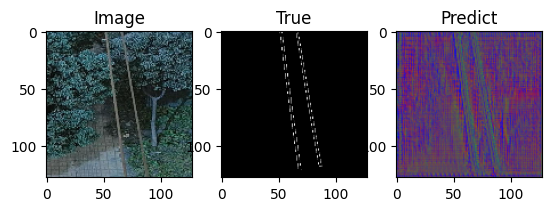

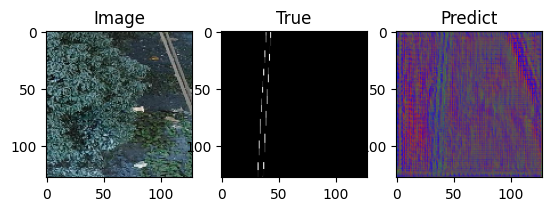

...

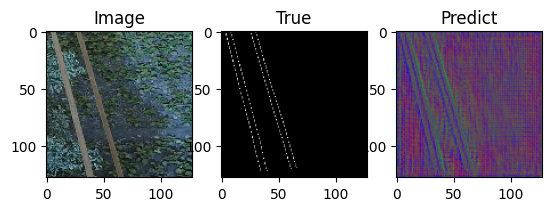

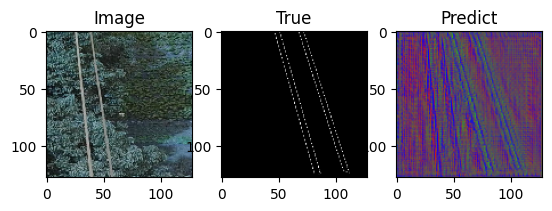

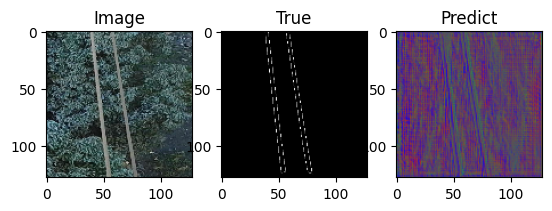

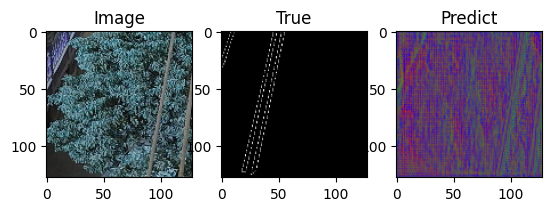

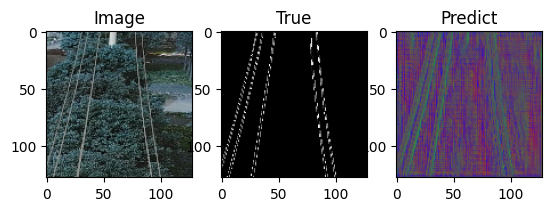

In [87]:
for x,y,pred in zip(X_train, y_train, y_train_pred):

    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    ax1.set_title("Image")
    ax1.imshow(x)
    ax2.set_title("True")
    ax2.imshow(y)
    ax3.set_title("Predict")
    ax3.imshow(pred)

#### Train - gray model

In [273]:
def preprocess_images(X,y, percentile = .9):
    X = X.reshape(X.shape[0], X.shape[1], X.shape[2], 1)
    y = y.reshape(y.shape[0], y.shape[1], y.shape[2], 1)
    print("New Shape :",X.shape, y.shape)

    percentile_split = int(X.shape[0] * percentile)
    print("Split @ : ", percentile_split)

    X_train = X[0:percentile_split]
    X_test = X[percentile_split:]
    y_train = y[0:percentile_split]
    y_test = y[percentile_split:]

    print("Shapes after split : ", X_train.shape, y_train.shape,X_test.shape, y_test.shape )
    return (X_train, X_test, y_train, y_test )

In [275]:
X_train, X_test, y_train, y_test = preprocess_images(X_gray, y_gray)

New Shape : (30, 128, 128, 1) (30, 128, 128, 1)
Split @ :  27
Shapes after split :  (27, 128, 128, 1) (27, 128, 128, 1) (3, 128, 128, 1) (3, 128, 128, 1)


#### Ablation

Epoch 1/3
3/3 [==============================] - ETA: 0s - loss: 0.0815 - accuracy: 0.9725
Epoch 1: val_loss improved from inf to 0.06626, saving model to model/ablation/best_model.h5
3/3 [==============================] - 7s 2s/step - loss: 0.0815 - accuracy: 0.9725 - val_loss: 0.0663 - val_accuracy: 0.9828 - lr: 0.0100
Epoch 2/3
3/3 [==============================] - ETA: 0s - loss: 0.0812 - accuracy: 0.9725
Epoch 2: val_loss improved from 0.06626 to 0.06590, saving model to model/ablation/best_model.h5
3/3 [==============================] - 6s 2s/step - loss: 0.0812 - accuracy: 0.9725 - val_loss: 0.0659 - val_accuracy: 0.9828 - lr: 0.0100
Epoch 3/3
3/3 [==============================] - ETA: 0s - loss: 0.0809 - accuracy: 0.9725
Epoch 3: val_loss improved from 0.06590 to 0.06553, saving model to model/ablation/best_model.h5
3/3 [==============================] - 6s 2s/step - loss: 0.0809 - accuracy: 0.9725 - val_loss: 0.0655 - val_accuracy: 0.9828 - lr: 0.0100


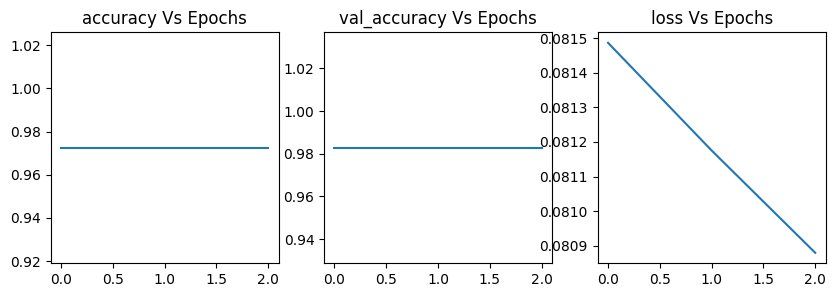

1/1 [==============================] - 0s 484ms/step - loss: 0.8924 - accuracy: 0.0376
[0.8924424052238464, 0.0376180000603199]
1/1 [==============================] - 0s 335ms/step


<Figure size 3000x700 with 0 Axes>

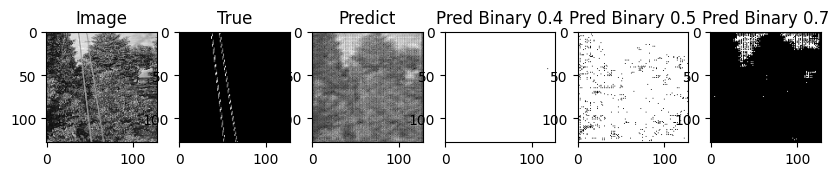

<Figure size 3000x700 with 0 Axes>

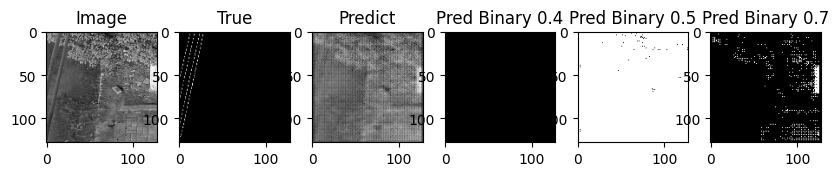

<Figure size 3000x700 with 0 Axes>

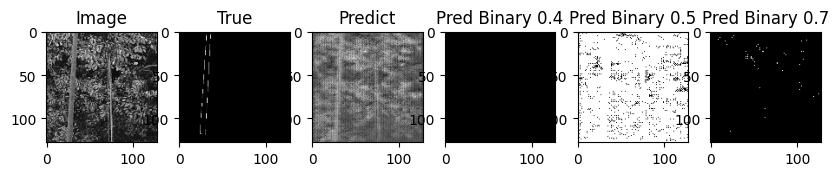

In [247]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model/ablation/best_model.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

train_unet_model(X_train, y_train, (X_test, y_test), epochs=3, callbacks=callbacks)

#### Adam optimizer with learning rate 1e-4

Epoch 1/10
3/3 [==============================] - ETA: 0s - loss: 0.6533 - accuracy: 0.5467
Epoch 1: val_loss improved from inf to 0.31338, saving model to model/adam_optimizer_with_lr/best_model.h5
3/3 [==============================] - 9s 2s/step - loss: 0.6533 - accuracy: 0.5467 - val_loss: 0.3134 - val_accuracy: 0.9631 - lr: 1.0000e-04
Epoch 2/10
3/3 [==============================] - ETA: 0s - loss: 0.1829 - accuracy: 0.9693
Epoch 2: val_loss improved from 0.31338 to 0.17665, saving model to model/adam_optimizer_with_lr/best_model.h5
3/3 [==============================] - 7s 2s/step - loss: 0.1829 - accuracy: 0.9693 - val_loss: 0.1767 - val_accuracy: 0.9694 - lr: 1.0000e-04
Epoch 3/10
3/3 [==============================] - ETA: 0s - loss: 0.1664 - accuracy: 0.9737
Epoch 3: val_loss improved from 0.17665 to 0.11355, saving model to model/adam_optimizer_with_lr/best_model.h5
3/3 [==============================] - 7s 2s/step - loss: 0.1664 - accuracy: 0.9737 - val_loss: 0.1136 - val_

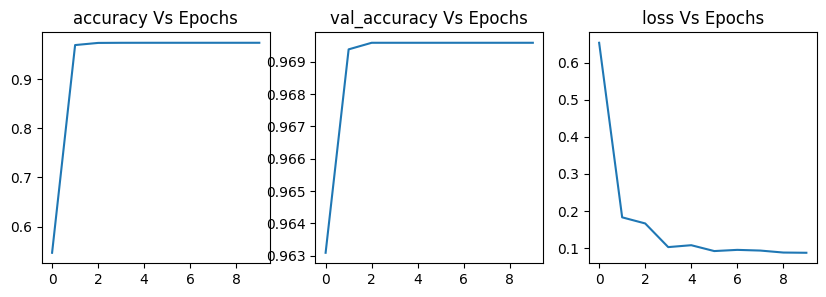

1/1 [==============================] - 0s 237ms/step - loss: 0.1029 - accuracy: 0.9696
[0.10287115722894669, 0.9695841670036316]
1/1 [==============================] - 0s 354ms/step


<Figure size 3000x700 with 0 Axes>

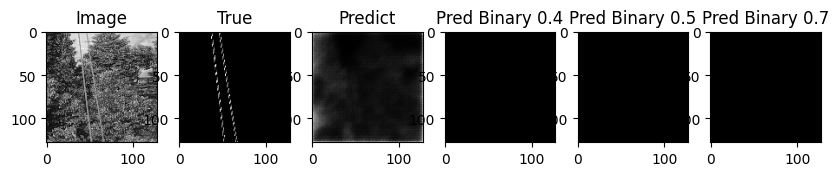

<Figure size 3000x700 with 0 Axes>

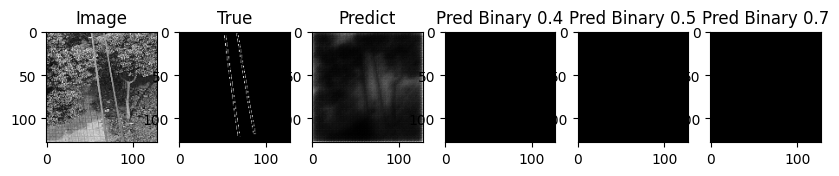

<Figure size 3000x700 with 0 Axes>

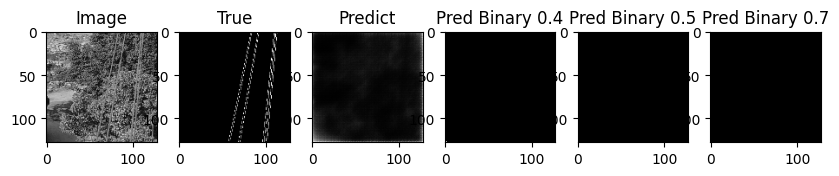

In [279]:
epochs = 100
callbacks = [
    #EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.75, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model/adam_optimizer_with_lr//best_model.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

train_unet_model(X_train, y_train, (X_test, y_test), epochs=epochs, optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=1e-4), callbacks=callbacks)

#### Optimizer SGD

Epoch 1/10
3/3 [==============================] - ETA: 0s - loss: 0.4986 - accuracy: 0.9649
Epoch 1: val_loss improved from inf to 0.35298, saving model to model/sgd_optimizer/best_model.h5
3/3 [==============================] - 9s 3s/step - loss: 0.4986 - accuracy: 0.9649 - val_loss: 0.3530 - val_accuracy: 0.9696 - lr: 0.0100
Epoch 2/10
3/3 [==============================] - ETA: 0s - loss: 0.2956 - accuracy: 0.9739
Epoch 2: val_loss improved from 0.35298 to 0.22149, saving model to model/sgd_optimizer/best_model.h5
3/3 [==============================] - 9s 3s/step - loss: 0.2956 - accuracy: 0.9739 - val_loss: 0.2215 - val_accuracy: 0.9696 - lr: 0.0100
Epoch 3/10
3/3 [==============================] - ETA: 0s - loss: 0.1893 - accuracy: 0.9739
Epoch 3: val_loss improved from 0.22149 to 0.16000, saving model to model/sgd_optimizer/best_model.h5
3/3 [==============================] - 9s 3s/step - loss: 0.1893 - accuracy: 0.9739 - val_loss: 0.1600 - val_accuracy: 0.9696 - lr: 0.0100
Epoch

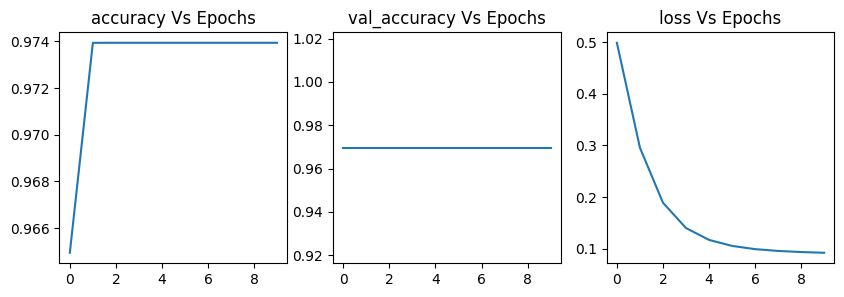

1/1 [==============================] - 0s 264ms/step - loss: 0.1024 - accuracy: 0.9696
[0.10240905731916428, 0.9695841670036316]
1/1 [==============================] - 0s 362ms/step


<Figure size 3000x700 with 0 Axes>

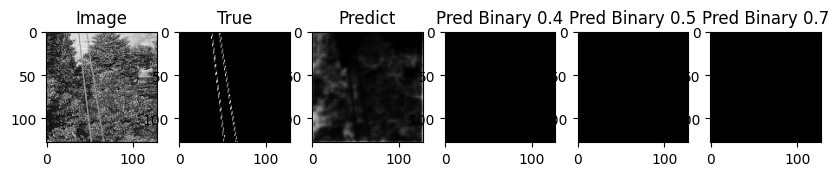

<Figure size 3000x700 with 0 Axes>

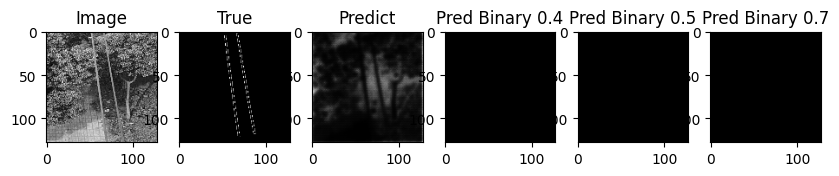

<Figure size 3000x700 with 0 Axes>

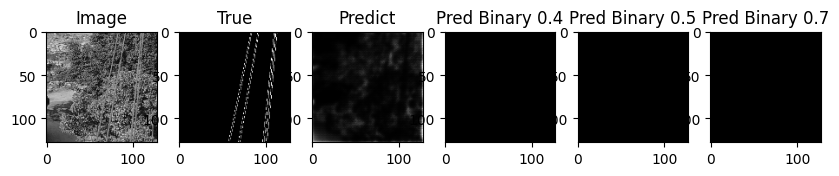

In [280]:
epochs = 100
callbacks = [
    #EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.75, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model/sgd_optimizer/best_model.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

train_unet_model(X_train, y_train, (X_test, y_test), epochs=epochs, optimizer=tf.keras.optimizers.legacy.SGD(), callbacks=callbacks)

#### Train for 1000 epochs

In [253]:
callbacks = [
    #EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model/1000epochs//best_model.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

train_unet_model(X_train, y_train, (X_test, y_test), epochs=1000, callbacks=callbacks)

Epoch 1/1000
3/3 [==============================] - ETA: 0s - loss: 0.0680 - accuracy: 0.9725
Epoch 1: val_loss improved from inf to 0.04949, saving model to model/1000epochs/best_model.h5
3/3 [==============================] - 7s 2s/step - loss: 0.0680 - accuracy: 0.9725 - val_loss: 0.0495 - val_accuracy: 0.9828 - lr: 1.0000e-05
Epoch 2/1000
3/3 [==============================] - ETA: 0s - loss: 0.0680 - accuracy: 0.9725
Epoch 2: val_loss improved from 0.04949 to 0.04949, saving model to model/1000epochs/best_model.h5
3/3 [==============================] - 7s 2s/step - loss: 0.0680 - accuracy: 0.9725 - val_loss: 0.0495 - val_accuracy: 0.9828 - lr: 1.0000e-05
Epoch 3/1000
3/3 [==============================] - ETA: 0s - loss: 0.0680 - accuracy: 0.9725
Epoch 3: val_loss improved from 0.04949 to 0.04949, saving model to model/1000epochs/best_model.h5
3/3 [==============================] - 6s 2s/step - loss: 0.0680 - accuracy: 0.9725 - val_loss: 0.0495 - val_accuracy: 0.9828 - lr: 1.0000e

KeyboardInterrupt: 

#### AUC Metric

Epoch 1/100
3/3 [==============================] - ETA: 0s - loss: 0.5703 - auc: 0.4868
Epoch 1: val_loss improved from inf to 0.21676, saving model to model/100epochs/best_model.h5
3/3 [==============================] - 9s 3s/step - loss: 0.5703 - auc: 0.4868 - val_loss: 0.2168 - val_auc: 0.3273 - lr: 0.0010
Epoch 2/100
3/3 [==============================] - ETA: 0s - loss: 0.1446 - auc: 0.3782
Epoch 2: val_loss improved from 0.21676 to 0.11821, saving model to model/100epochs/best_model.h5
3/3 [==============================] - 8s 2s/step - loss: 0.1446 - auc: 0.3782 - val_loss: 0.1182 - val_auc: 0.4298 - lr: 0.0010
Epoch 3/100
3/3 [==============================] - ETA: 0s - loss: 0.1211 - auc: 0.4575
Epoch 3: val_loss did not improve from 0.11821
3/3 [==============================] - 7s 2s/step - loss: 0.1211 - auc: 0.4575 - val_loss: 0.1235 - val_auc: 0.4222 - lr: 0.0010
Epoch 4/100
3/3 [==============================] - ETA: 0s - loss: 0.1029 - auc: 0.4010
Epoch 4: val_loss impr

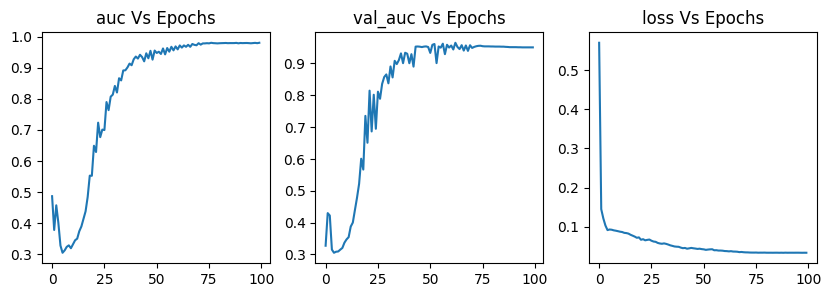

1/1 [==============================] - 0s 256ms/step - loss: 0.0439 - auc: 0.9506
[0.043909817934036255, 0.9506264925003052]
1/1 [==============================] - 0s 340ms/step


<Figure size 3000x700 with 0 Axes>

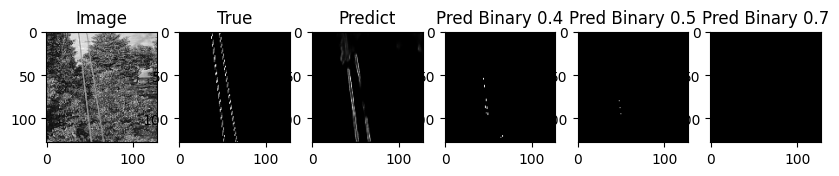

<Figure size 3000x700 with 0 Axes>

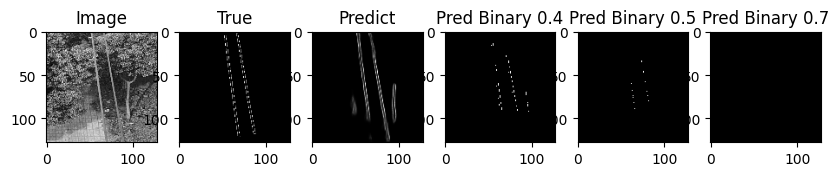

<Figure size 3000x700 with 0 Axes>

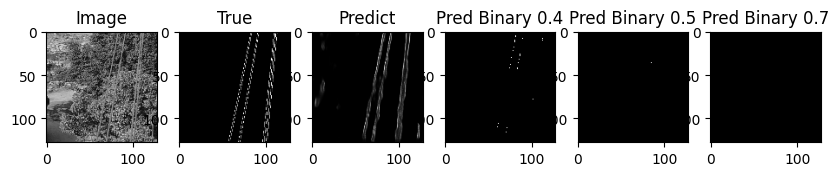

In [287]:
epochs = 100

callbacks = [
    #EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model/auc_metric/best_model.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

train_unet_model(X_train, y_train, (X_test, y_test), epochs=epochs, metrics=['AUC'], callbacks=callbacks)

In [293]:
def predict_n_plot(model, X, y):
    
    print(model.evaluate(X, y))

    y_pred = model.predict(X)
    y_pred_t_4 = (y_pred > .4).astype(np.uint8)
    y_pred_t_5 = (y_pred > .5).astype(np.uint8)
    y_pred_t_7 = (y_pred > .7).astype(np.uint8)

    for x , y , pred , pred_t_4 , pred_t_5, pred_t_7 in zip(X, y, y_pred, y_pred_t_4, y_pred_t_5, y_pred_t_7):

        plt.figure(figsize=(30,7))

        _ , (ax1,ax2,ax3,ax4,ax5,ax6) = plt.subplots(1,6, figsize=(10,5))
        ax1.set_title("Image")
        ax1.imshow(x, cmap="gray")
        
        ax2.set_title("True")
        ax2.imshow(y, cmap="gray")
        
        ax3.set_title("Predict")
        ax3.imshow(pred, cmap="gray")
        
        ax4.set_title("Pred Binary 0.4")
        ax4.imshow(pred_t_4, cmap="gray")

        ax5.set_title("Pred Binary 0.5")
        ax5.imshow(pred_t_5, cmap="gray")

        ax6.set_title("Pred Binary 0.7")
        ax6.imshow(pred_t_7, cmap="gray")
    

1/1 [==============================] - 3s 3s/step - loss: 0.0332 - accuracy: 0.9739
[0.03320510685443878, 0.9739063382148743]
1/1 [==============================] - 2s 2s/step


/var/folders/hm/r5pwp4rs5zd7v5745srhxk7w0000gn/T/ipykernel_4779/3278747216.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(30,7))


<Figure size 3000x700 with 0 Axes>

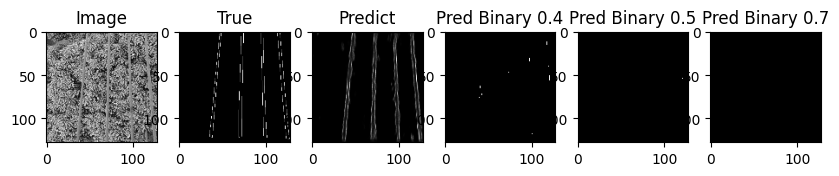

<Figure size 3000x700 with 0 Axes>

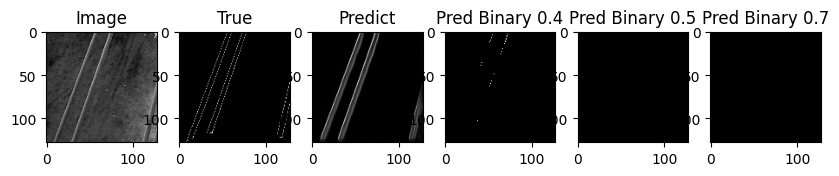

<Figure size 3000x700 with 0 Axes>

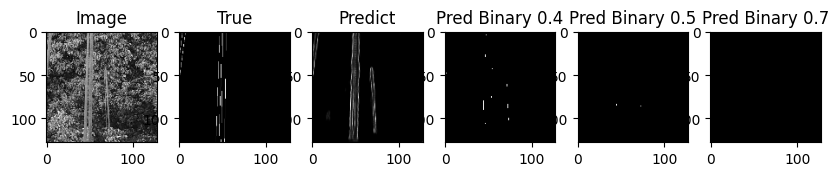

<Figure size 3000x700 with 0 Axes>

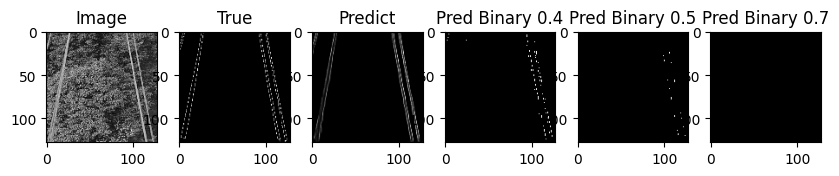

<Figure size 3000x700 with 0 Axes>

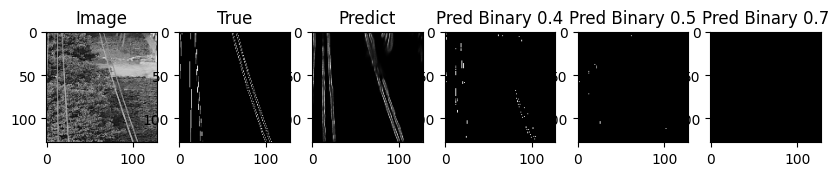

<Figure size 3000x700 with 0 Axes>

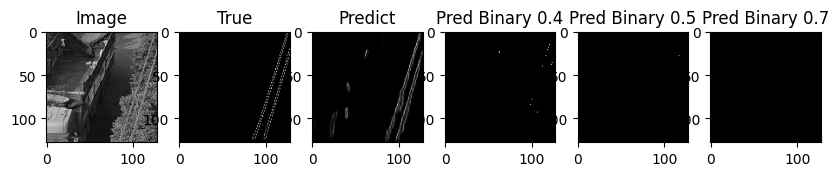

<Figure size 3000x700 with 0 Axes>

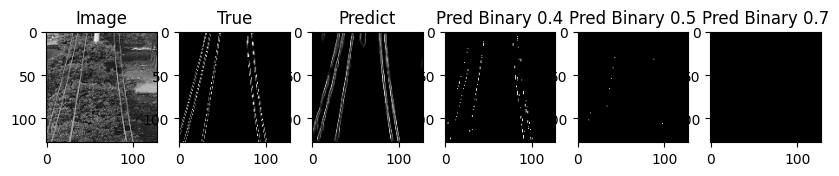

<Figure size 3000x700 with 0 Axes>

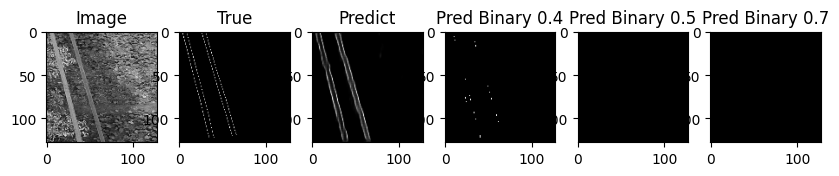

<Figure size 3000x700 with 0 Axes>

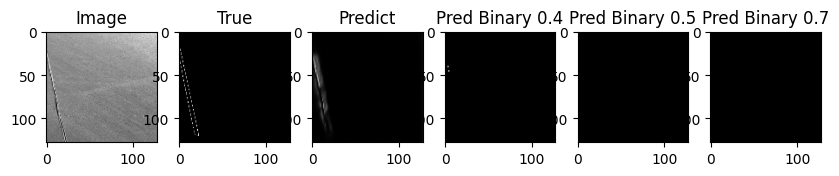

<Figure size 3000x700 with 0 Axes>

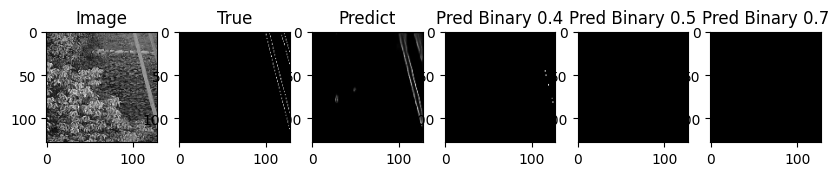

<Figure size 3000x700 with 0 Axes>

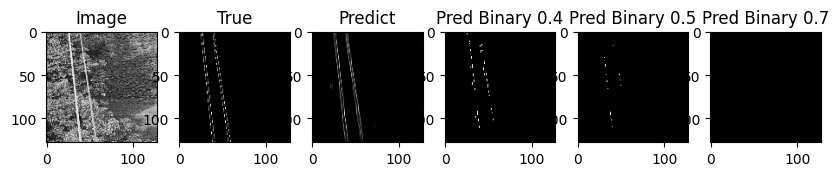

<Figure size 3000x700 with 0 Axes>

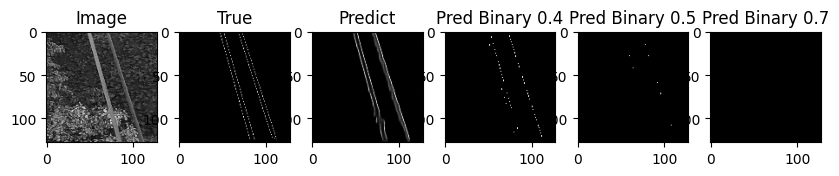

<Figure size 3000x700 with 0 Axes>

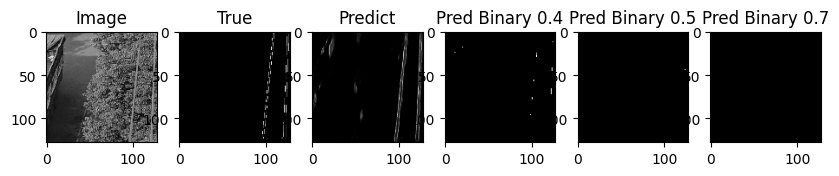

<Figure size 3000x700 with 0 Axes>

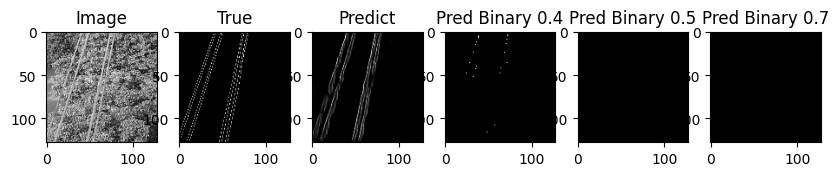

<Figure size 3000x700 with 0 Axes>

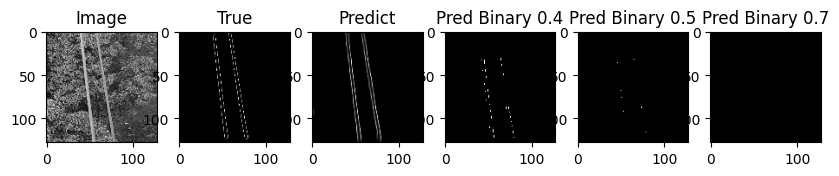

<Figure size 3000x700 with 0 Axes>

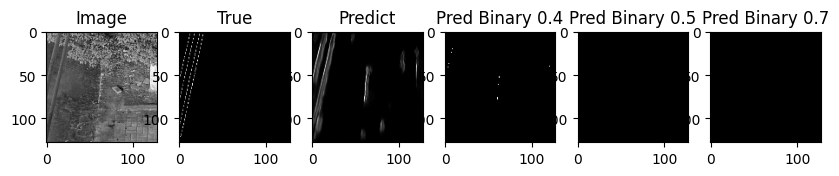

<Figure size 3000x700 with 0 Axes>

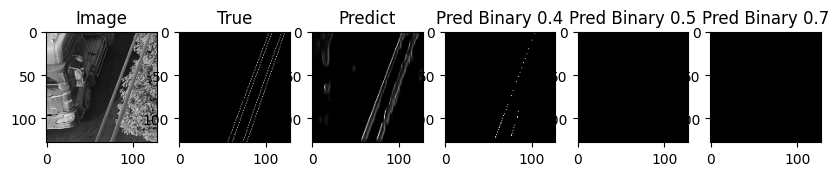

<Figure size 3000x700 with 0 Axes>

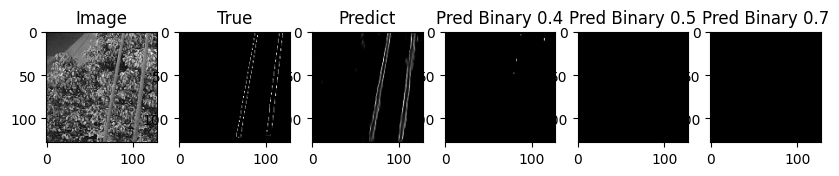

<Figure size 3000x700 with 0 Axes>

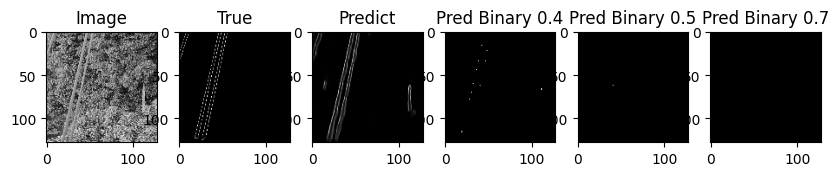

<Figure size 3000x700 with 0 Axes>

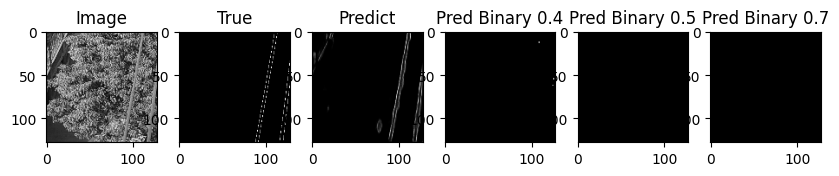

<Figure size 3000x700 with 0 Axes>

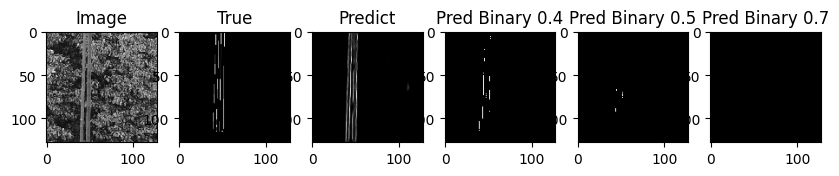

<Figure size 3000x700 with 0 Axes>

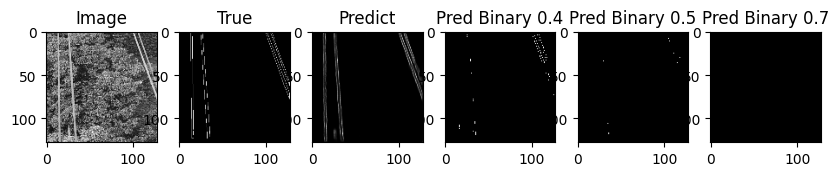

<Figure size 3000x700 with 0 Axes>

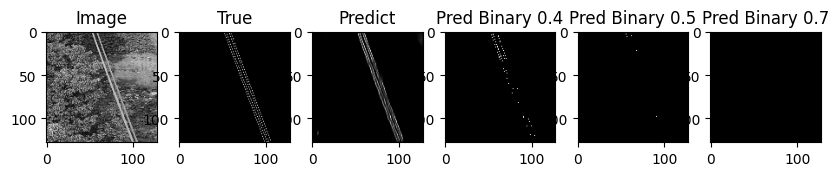

<Figure size 3000x700 with 0 Axes>

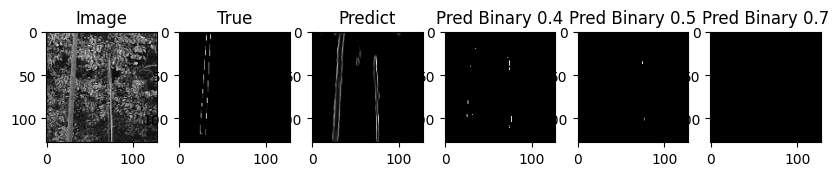

<Figure size 3000x700 with 0 Axes>

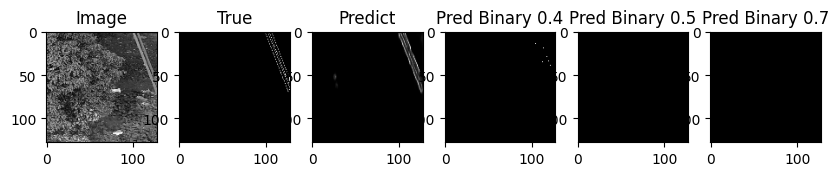

<Figure size 3000x700 with 0 Axes>

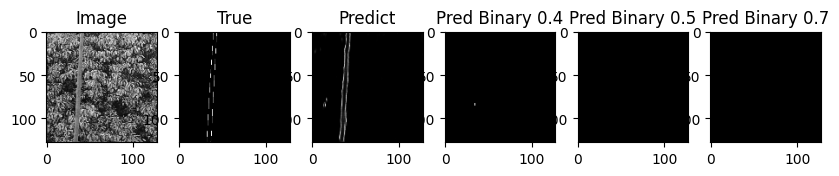

<Figure size 3000x700 with 0 Axes>

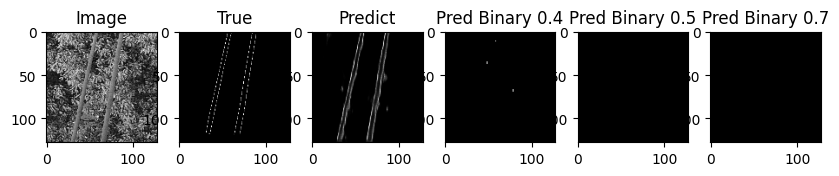

In [294]:
model = build_unet_model(is_out_gray=True)

model.load_weights("model/100epochs/best_model.h5")

predict_n_plot(model, X_train, y_train)

#### Thresholds 0.4,0.5,0.7